In [1]:
import scanpy as sc

In [2]:
fdata = sc.read_h5ad('./RNA/sc.combined.h5')

In [3]:
sc.tl.leiden(fdata, resolution=0.5)

/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


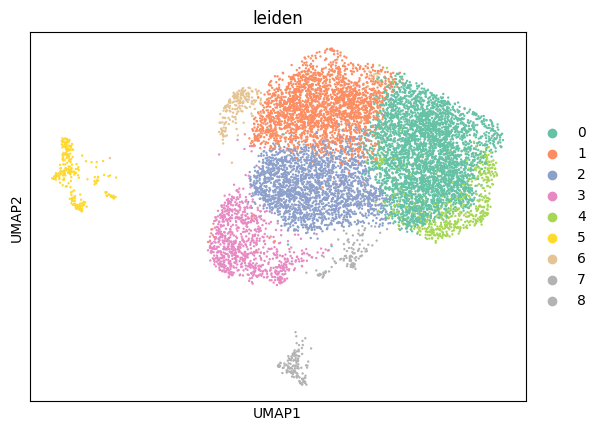

In [4]:
sc.pl.umap(fdata, color='leiden', palette='Set2')

/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/numpy/core/fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)


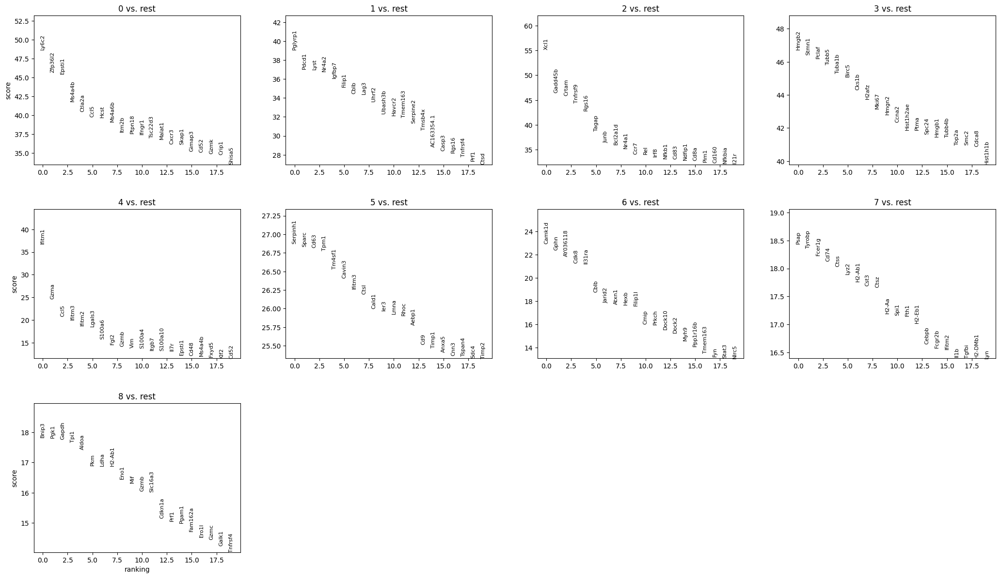

In [22]:
sc.tl.rank_genes_groups(fdata, groupby='leiden', method='wilcoxon')
sc.pl.rank_genes_groups(fdata, n_genes=20, sharey=False)

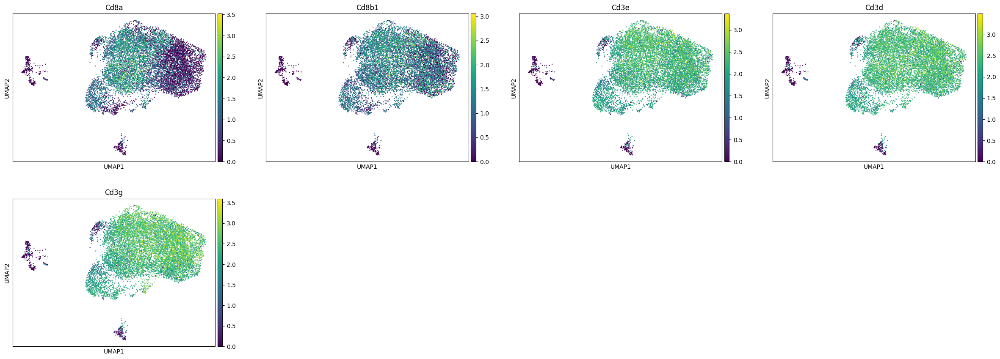

In [37]:
sc.pl.umap(fdata, color=['Cd8a', 'Cd8b1', 'Cd3e', 'Cd3d', 'Cd3g'])

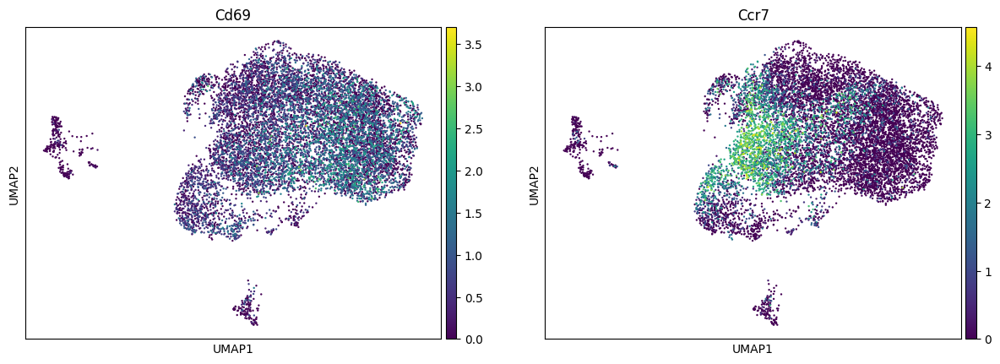

In [33]:
sc.pl.umap(fdata, color=['Cd69', 'Ccr7'])

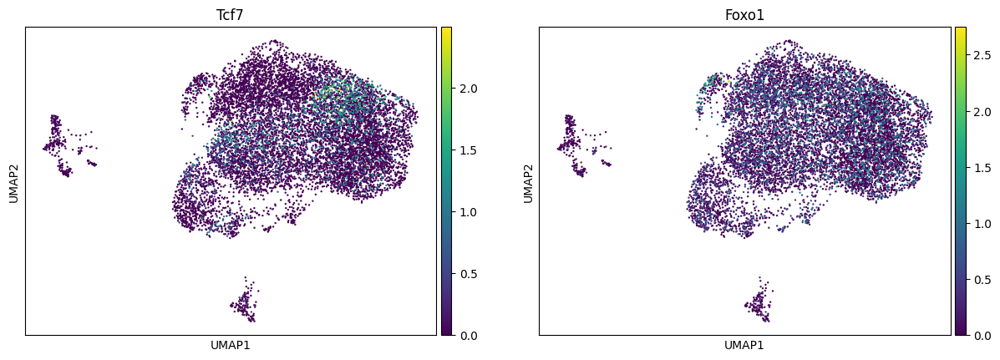

In [31]:
sc.pl.umap(fdata, color=['Tcf7', 'Foxo1'])

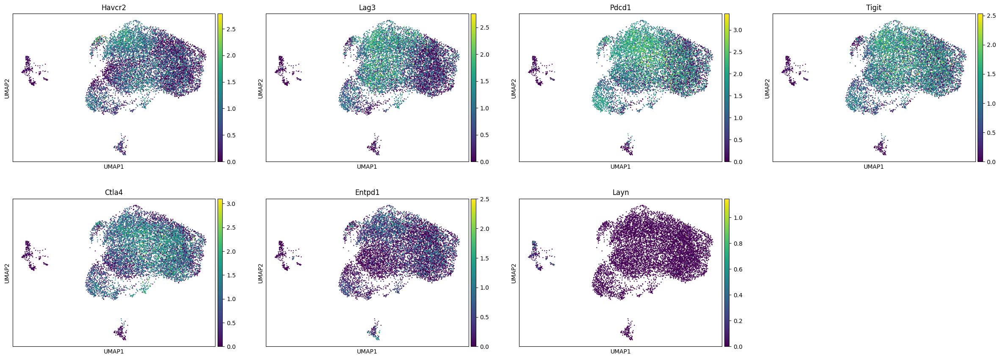

In [30]:
sc.pl.umap(fdata, color=['Havcr2', 'Lag3', 'Pdcd1', 'Tigit', 'Ctla4', 'Entpd1', 'Layn'])

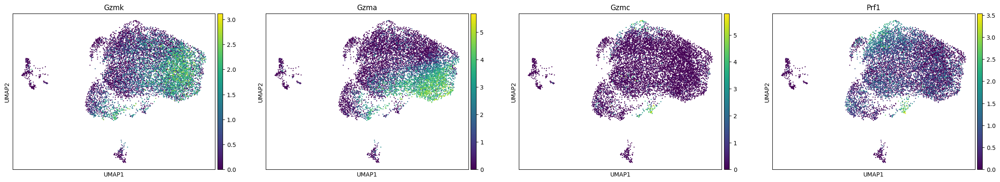

In [36]:
sc.pl.umap(fdata, color=['Gzmk','Gzma','Gzmc', 'Prf1'])

/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


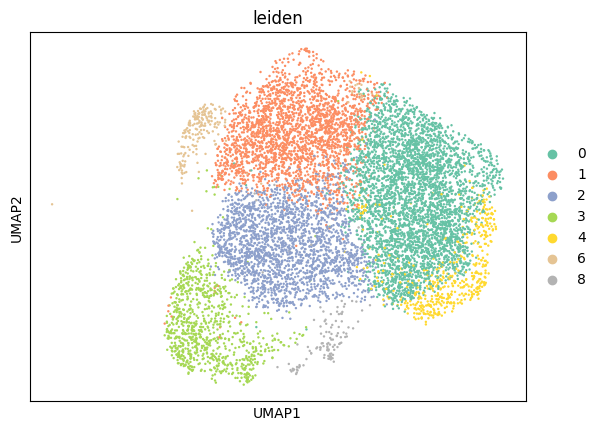

In [5]:
cleandata = fdata[(fdata.obs['leiden'] != '5') & (fdata.obs['leiden'] != '7')].copy()
sc.pl.umap(cleandata, color='leiden', palette='Set2')

In [6]:
sc.pp.neighbors(cleandata, n_neighbors=10, n_pcs=30)
sc.tl.umap(cleandata)

In [7]:
cleandata.write_h5ad('./RNA/sc.reclustered.h5')

In [2]:
cleandata = sc.read_h5ad('./RNA/sc.reclustered.h5')

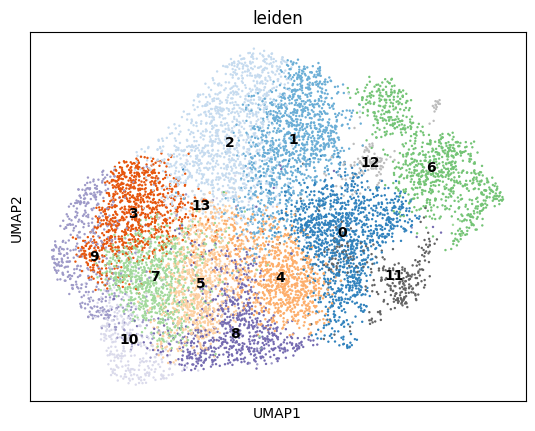

In [57]:
sc.tl.leiden(cleandata, resolution=1)
sc.pl.umap(cleandata, color='leiden', palette='tab20c', legend_loc='on data')

In [4]:
sc.tl.rank_genes_groups(cleandata, groupby='leiden', method='t-test')

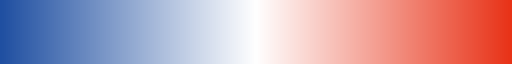

In [5]:
from types import new_class
from matplotlib.colors import LinearSegmentedColormap

colors = ['#1f4fa1', '#ffffff', '#e83217']
n_bins = 256
new_cmap = LinearSegmentedColormap.from_list('custom_diverging', colors, N=n_bins)
new_cmap

In [59]:
sc.tl.rank_genes_groups(cleandata, groupby='leiden', method='t-test')

categories: 0, 1, 2, etc.
var_group_labels: 1, 2, 3, etc.


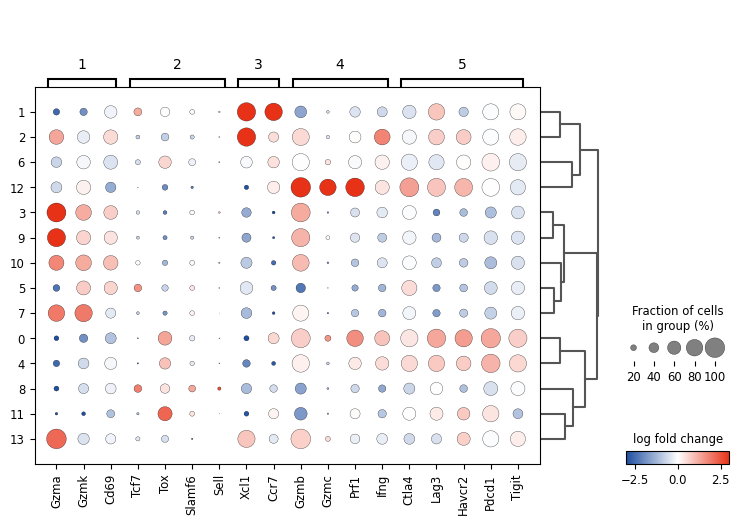

In [60]:
import warnings
warnings.filterwarnings('ignore')

sc.tl.dendrogram(cleandata, groupby='leiden')
sc.pl.rank_genes_groups_dotplot(cleandata, groupby='leiden',
                                var_names={
                                           '1': ['Gzma', 'Gzmk', 'Cd69'],
                                           '2': ['Tcf7', 'Tox', 'Slamf6', 'Sell'],
                                           '3': ['Xcl1', 'Ccr7'],
                                           '4': ['Gzmb', 'Gzmc', 'Prf1', 'Ifng'],
                                           '5': ['Ctla4', 'Lag3',  'Havcr2', 'Pdcd1', 'Tigit']},
                                vmin=-3, vmax=3,
                                values_to_plot='logfoldchanges', cmap=new_cmap)

In [82]:
cleandata.obs['phenotype'] = cleandata.obs['leiden'].map({
    '1': 'Trm',
    '2': 'Teff',
    '6': 'Teff',
    '12': 'Teff',
    '3': 'Tem',
    '4': 'Tex',
    '5': 'Tpex',
    '7': 'Tem',
    '8': 'Tpex',
    '11': 'Teff',
    '13': 'Teff',
    '9': 'Tem',
    '10': 'Tem',
    '0': 'Tex'
})

In [83]:
sc.tl.rank_genes_groups(cleandata, groupby='phenotype', method='t-test')

categories: Teff, Tem, Tex, etc.
var_group_labels: 1, 2, 5, etc.


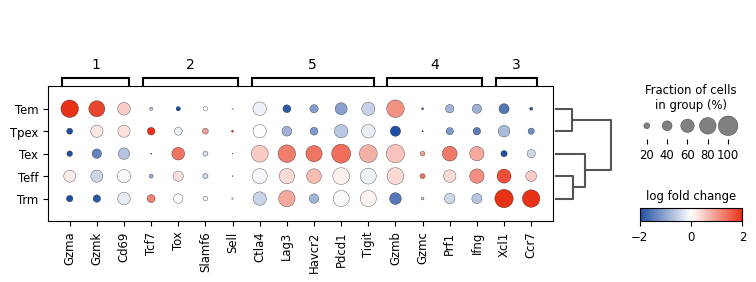

In [84]:
import warnings
warnings.filterwarnings('ignore')

plot_data = cleandata[cleandata.obs.phenotype != 'n']
sc.tl.dendrogram(plot_data, groupby='phenotype')
fig = sc.pl.rank_genes_groups_dotplot(plot_data, groupby='phenotype',
                                var_names={ 
                                           '1': ['Gzma', 'Gzmk', 'Cd69'],
                                           '2': ['Tcf7', 'Tox', 'Slamf6', 'Sell'],
                                           '5': ['Ctla4', 'Lag3',  'Havcr2', 'Pdcd1', 'Tigit'],
                                           '4': ['Gzmb', 'Gzmc', 'Prf1', 'Ifng'],
                                           '3': ['Xcl1', 'Ccr7'],
                                           },
                                vmin=-2, vmax=2,
                                groups=['c1', 'c2', 'c3', 'c4'],
                                values_to_plot='logfoldchanges', cmap=new_cmap, return_fig=True)
fig.savefig('./plots/perturb_recluster_dotplot.pdf', dpi=300, bbox_inches='tight')

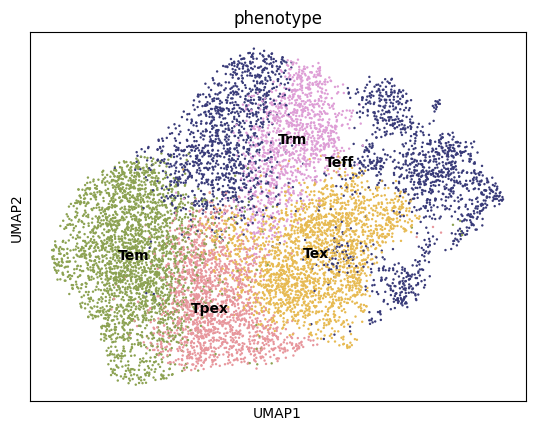

In [85]:
sc.pl.umap(cleandata, color=['phenotype'], palette='tab20b', return_fig=False, legend_loc='on data')

In [86]:
cleandata.write_h5ad('./RNA/sc.reclustered.h5')

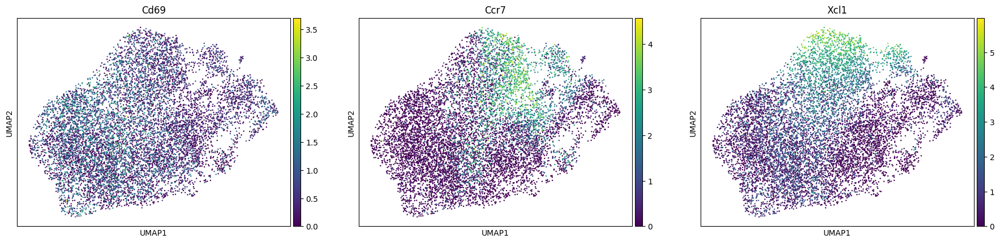

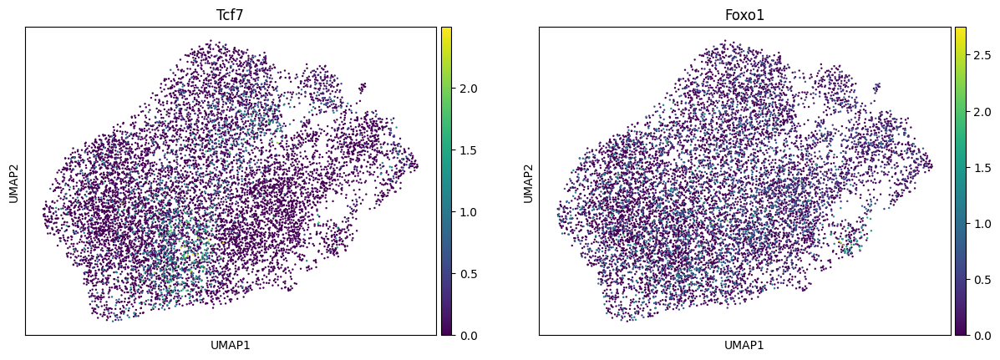

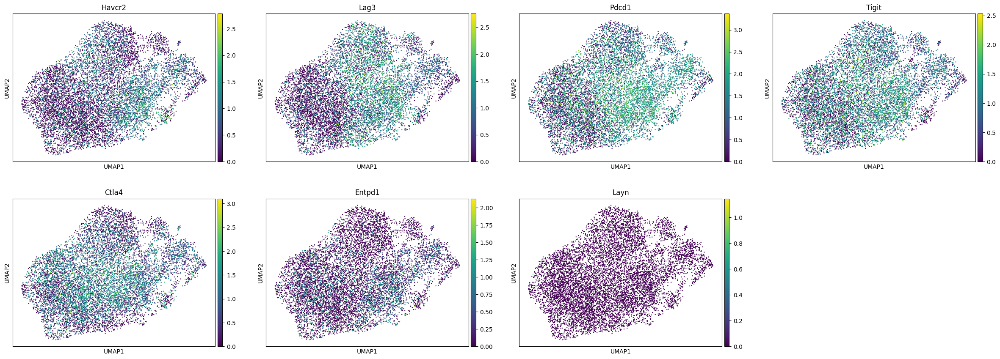

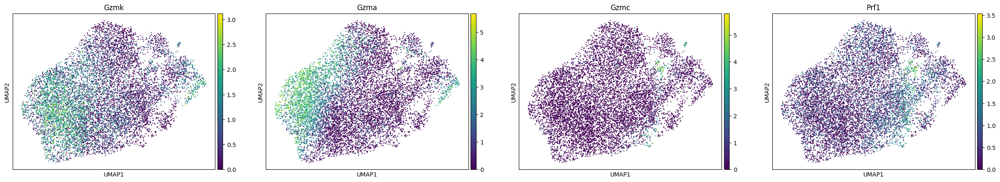

In [46]:
sc.pl.umap(cleandata, color=['Cd69', 'Ccr7', 'Xcl1'])
sc.pl.umap(cleandata, color=['Tcf7', 'Foxo1'])
sc.pl.umap(cleandata, color=['Havcr2', 'Lag3', 'Pdcd1', 'Tigit', 'Ctla4', 'Entpd1', 'Layn'])
sc.pl.umap(cleandata, color=['Gzmk','Gzma','Gzmc', 'Prf1'])